In [1]:
import tifffile
from matplotlib import pyplot as plt
%matplotlib inline

In [2]:
before = tifffile.imread('/mnt/data/denoising/xeno/32bit/all_volumes/Xenopus_13_3p125_ms_exp_750_proj.tif')
after = tifffile.imread('/mnt/data/denoising/xeno/32bit/all_volumes_processed/Xenopus_13_3p125_ms_exp_750_proj.tif')

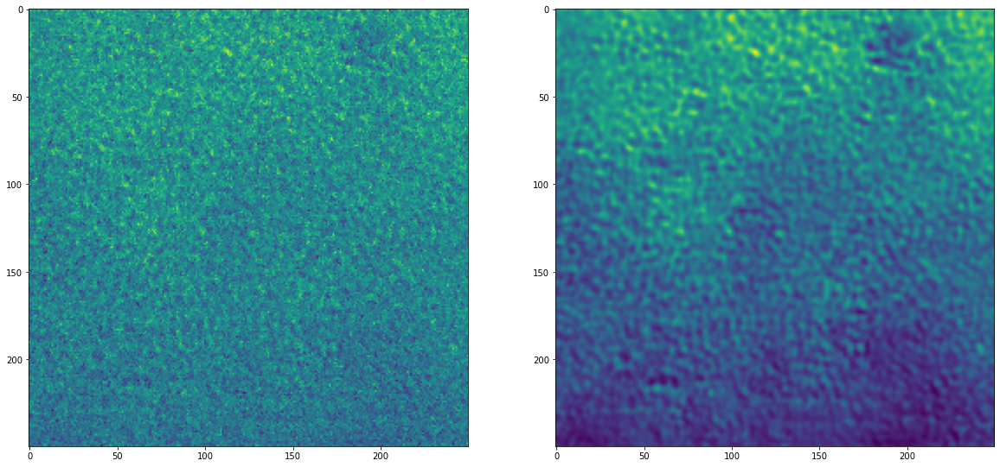

In [20]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
ax1.imshow(before[0][1500:1750, 750:1000])
ax2.imshow(after[0][1500:1750, 750:1000])
plt.show()

In [21]:
from skimage.restoration import denoise_nl_means, estimate_sigma

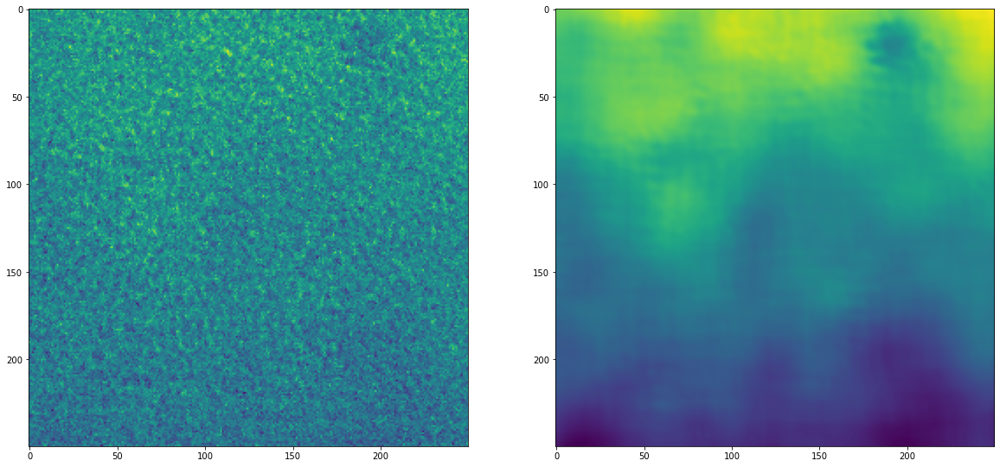

In [23]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
sigma_est = estimate_sigma(before[0])
after_nlm = denoise_nl_means(after[0], fast_mode=False)
ax1.imshow(before[0][1500:1750, 750:1000])
ax2.imshow(after_nlm[1500:1750, 750:1000])
plt.show()

In [18]:
from skimage.filters import rank
from skimage.morphology import disk
import numpy as np

In [60]:
from cil.framework import ImageGeometry, AcquisitionGeometry, AcquisitionData
from cil.plugins.astra import ProjectionOperator
from cil.plugins.astra.processors import FBP
from copy import deepcopy

#%%
n_proj = 751
imsize = 2016

def reconstruct_one_slice(sino):
    # set-up ccpi objects
    # multi-channel geometry
    ag_MC = AcquisitionGeometry.create_Parallel2D()
    ag_MC.set_panel(sino.shape[2], pixel_size=0.055)
    ag_MC.set_channels(num_channels=2)
    ag_MC.set_angles(np.linspace(0, 180, n_proj, endpoint=False), angle_unit='degree')
    # allocate AcquisitionGeometry and fill it in with actual sinogram
    ad_MC = ag_MC.allocate()
    ad_MC.fill(sino)
    # generate ImagGeometry
    ig_MC = ag_MC.get_ImageGeometry()
    
    # actual projection operator for iterative reconstruction
    op_MC = ProjectionOperator(ig_MC, ag_MC, 'gpu')

    # single slice geometry
    ag = ag_MC.get_slice(channel=0)
    ig = ag.get_ImageGeometry()

    #%% FBP recon
    FBP_recon = ig_MC.allocate()

    # FBP reconstruction per channel
    for i in range(ig_MC.channels):

        FBP_recon_2D = FBP(ig, ag, 'gpu')(ad_MC.get_slice(channel=i))
        FBP_recon.fill(FBP_recon_2D, channel=i)

        print("Finish FBP recon for channel {}".format(i), end='\r')

    print("\nFBP Reconstruction Complete!")
    # get actual numpy array
    FBP_recon = FBP_recon.as_array()
    
    return FBP_recon

In [26]:
tifffile.imread('/mnt/HD-LSDF/Xenopus/2021_11_Xenopus/Vergleichsmessungen_NN/Xenopus_14_25_ms_exp_750_proj/radios/frame_000001.tif').shape

(223, 2016, 2016)

In [38]:
after2 = np.concatenate([after[223:], after[:223]])

In [95]:
before2 = np.concatenate([before[223:], before[:223]])

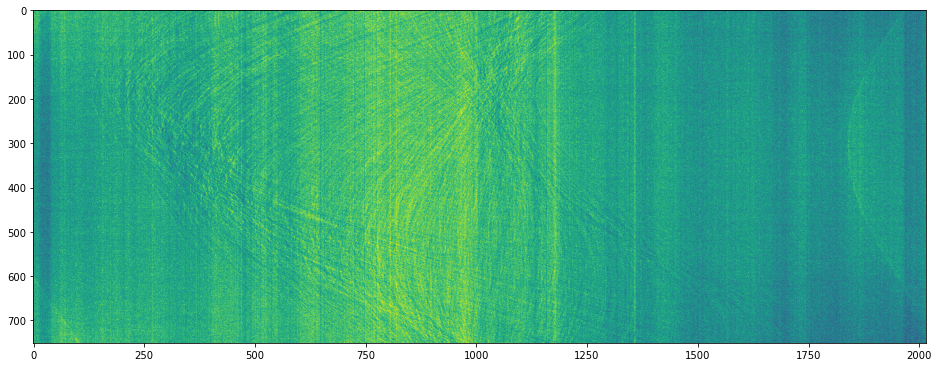

In [96]:
plt.figure(figsize=(16, 10))
plt.imshow(before2[:, 1000])

In [92]:
rec_after = reconstruct_one_slice(np.moveaxis(after2[:, 1000:1002, 57:], 1, 0))

Finish FBP recon for channel 1
FBP Reconstruction Complete!


In [97]:
rec_before = reconstruct_one_slice(np.moveaxis(before2[:, 1000:1002, 57:], 1, 0))

Finish FBP recon for channel 1
FBP Reconstruction Complete!


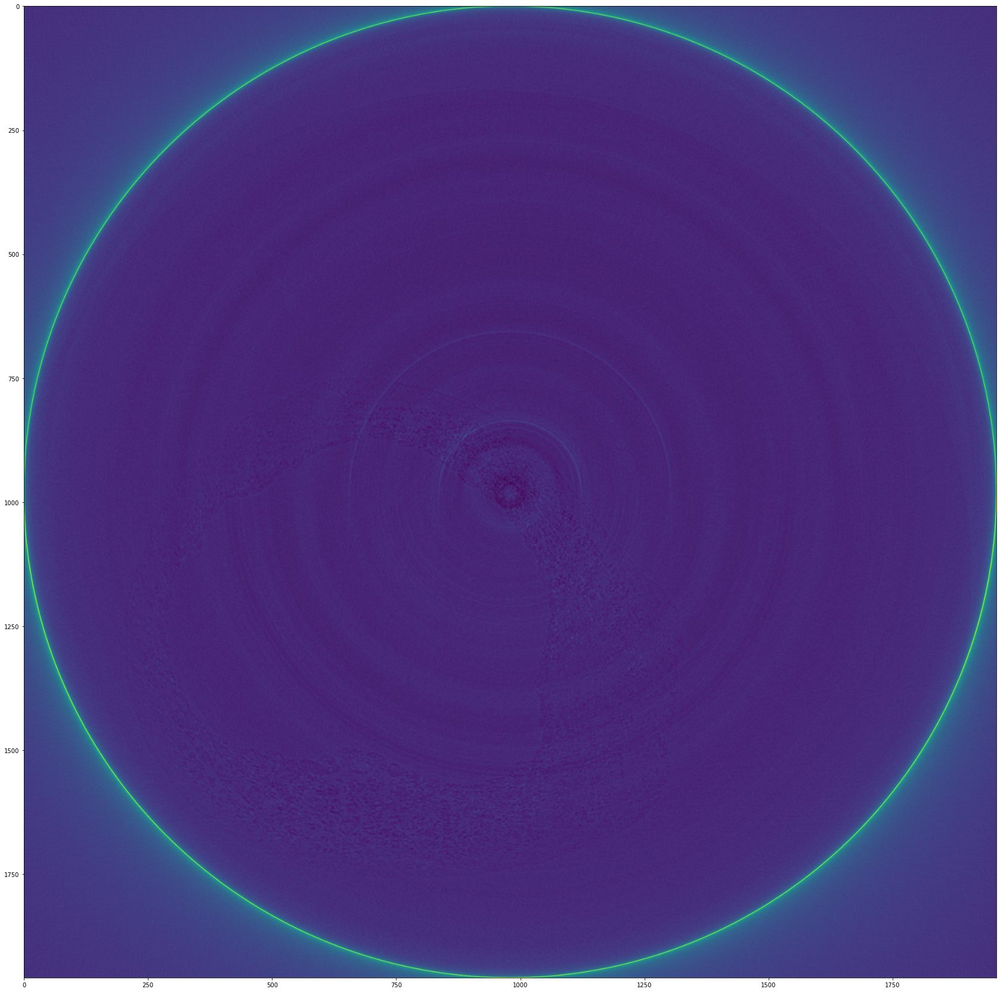

In [98]:
plt.figure(figsize=(30, 30))
plt.imshow(rec_after[0])
plt.show()

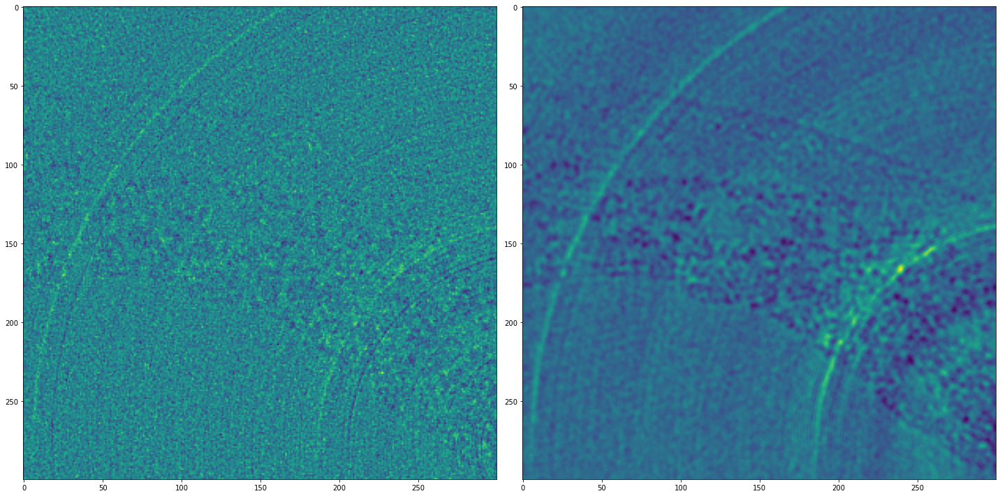

In [109]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
ax1.imshow(rec_before[0][700:1000, 650:950])
ax2.imshow(rec_after[0][700:1000, 650:950])
plt.tight_layout()
plt.show()

In [114]:
from skimage.filters import rank
from skimage.morphology import disk
from skimage.exposure import rescale_intensity

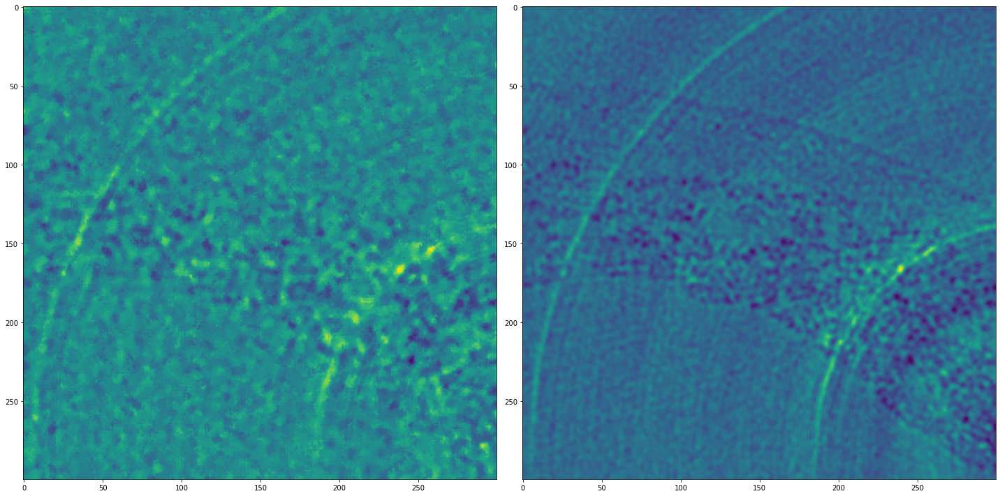

In [117]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
ax1.imshow(rank.median(rescale_intensity(rec_before[0][700:1000, 650:950], out_range=(0, 255)).astype(np.uint8), disk(3)))
ax2.imshow(rec_after[0][700:1000, 650:950])
plt.tight_layout()
plt.show()

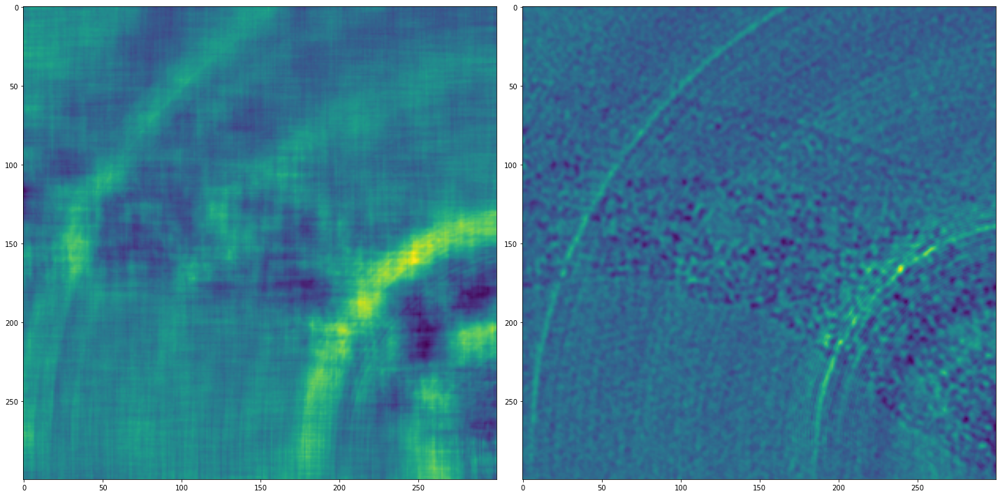

In [118]:
from skimage.restoration import denoise_nl_means, estimate_sigma

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
ax1.imshow(denoise_nl_means(rec_before[0][700:1000, 650:950], fast_mode=False))
ax2.imshow(rec_after[0][700:1000, 650:950])
plt.tight_layout()
plt.show()

In [122]:
%%time
new_projs = []
for i in [0, 1]:
    new_projs.append(tifffile.imread(f'/mnt/HD-LSDF/Xenopus/2021_11_Xenopus/Vergleichsmessungen_NN/Xenopus_13_3p125_ms_exp_750_proj/radios_corrected/{i}.tif'))
new_projs = np.concatenate(new_projs, 0)

CPU times: user 2.26 s, sys: 12 s, total: 14.3 s
Wall time: 20.1 s


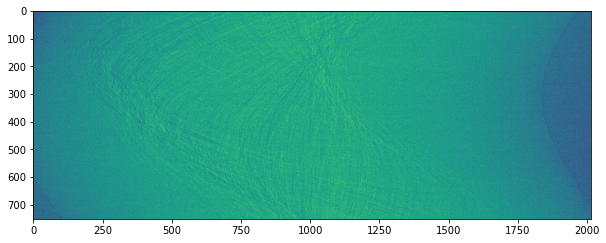

In [124]:
plt.figure(figsize=(10, 10))
plt.imshow(new_projs[:, 1000])
plt.show()

In [138]:
new_projs_nn = tifffile.imread('/mnt/data/denoising/xeno/32bit/all_volumes_processed/13_corr.tif')

In [135]:
rec_corr_before = reconstruct_one_slice(np.moveaxis(-new_projs[:, 1000:1002, 57:], 1, 0))

Finish FBP recon for channel 1
FBP Reconstruction Complete!


In [139]:
rec_corr_after = reconstruct_one_slice(np.moveaxis(new_projs_nn[:, 1000:1002, 57:], 1, 0))

Finish FBP recon for channel 1
FBP Reconstruction Complete!


In [128]:
def get_random_voxels(img, count):
    return img[tuple([np.random.randint(0, img.shape[i], count) for i in range(img.ndim)])]

CHUNK_SIZE = 256
import dask.array as da
from skimage.exposure import rescale_intensity
from functools import partial

def scale_intensity_parallel(img, in_percentiles=(0.1, 99.9), out_range=(-1, 1)):
    rs = get_random_voxels(img, 1_000_000)
    f = np.percentile(rs, in_percentiles[0])
    t = np.percentile(rs, in_percentiles[1])
    
    img = da.from_array(img, chunks=CHUNK_SIZE)
    scaler = partial(rescale_intensity, in_range=(f,t), out_range=out_range)
    img = img.map_blocks(scaler, dtype=img.dtype)
    img = np.array(img, dtype=img.dtype)

    return img

In [129]:
%%time
new_projs_scaled = scale_intensity_parallel(new_projs)

CPU times: user 46.4 s, sys: 23.4 s, total: 1min 9s
Wall time: 24.6 s


In [137]:
tifffile.imsave('/mnt/data/denoising/xeno/32bit/all_volumes/13_corr.tif', -new_projs_scaled)

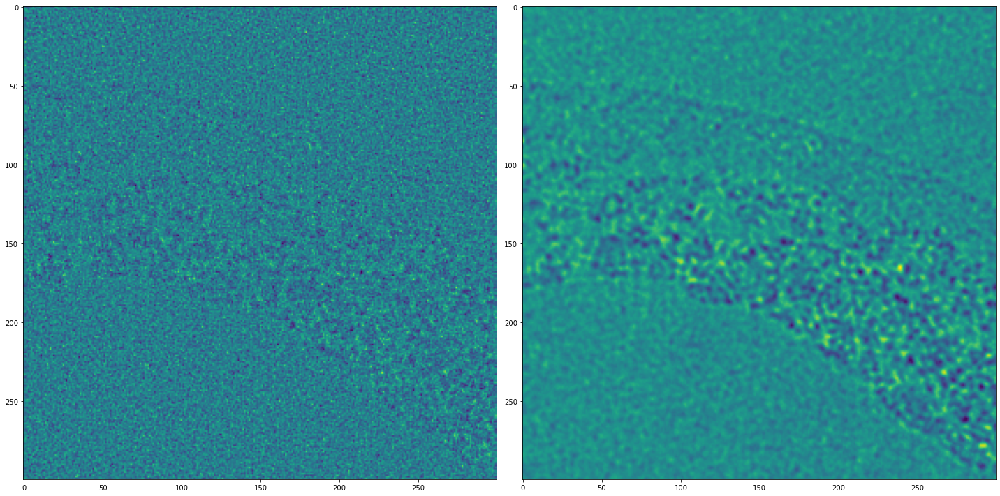

In [140]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
ax1.imshow(rec_corr_before[0][700:1000, 650:950])
ax2.imshow(rec_corr_after[0][700:1000, 650:950])
plt.tight_layout()
plt.show()

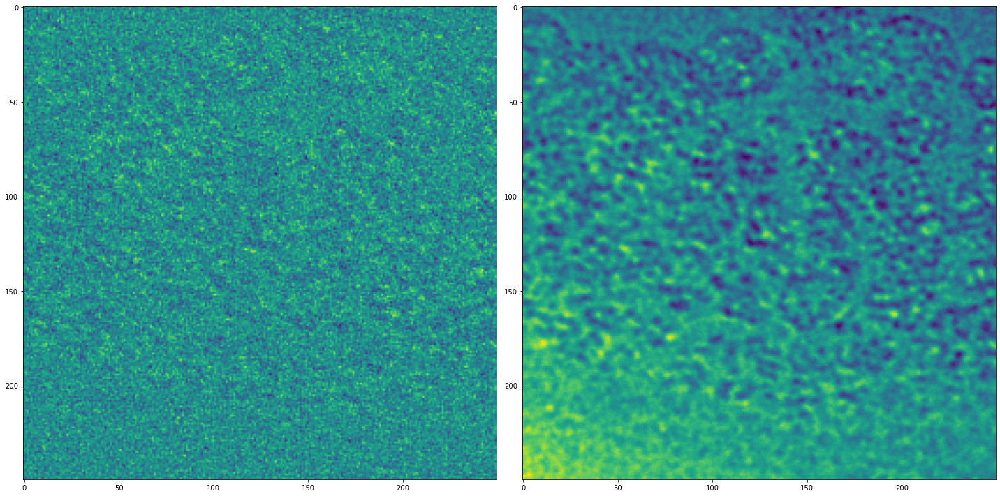

In [144]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
ax1.imshow(rec_corr_before[0][1500:1750, 500:750])
ax2.imshow(rec_corr_after[0][1500:1750, 500:750])
plt.tight_layout()
plt.show()

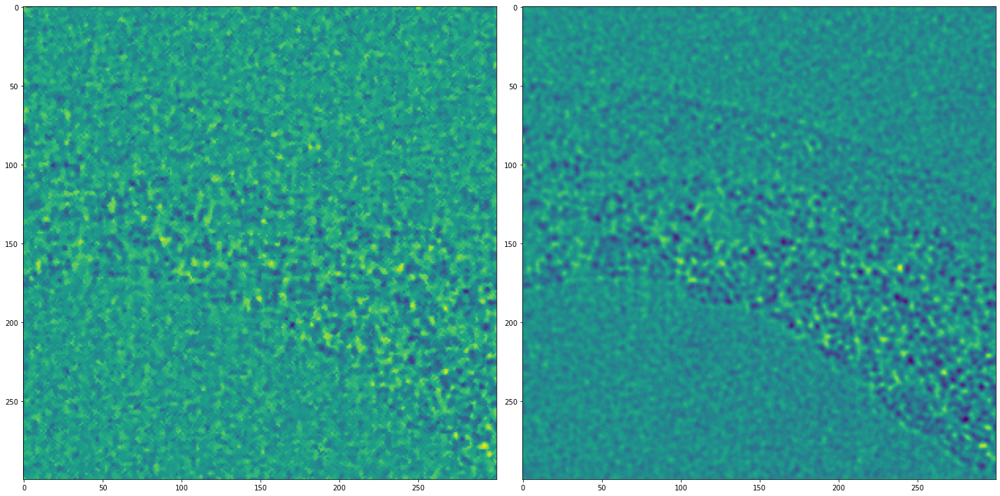

In [142]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
ax1.imshow(rank.median(rescale_intensity(rec_corr_before[0][700:1000, 650:950], out_range=(0, 255)).astype(np.uint8), disk(2)))
ax2.imshow(rec_corr_after[0][700:1000, 650:950])
plt.tight_layout()
plt.show()

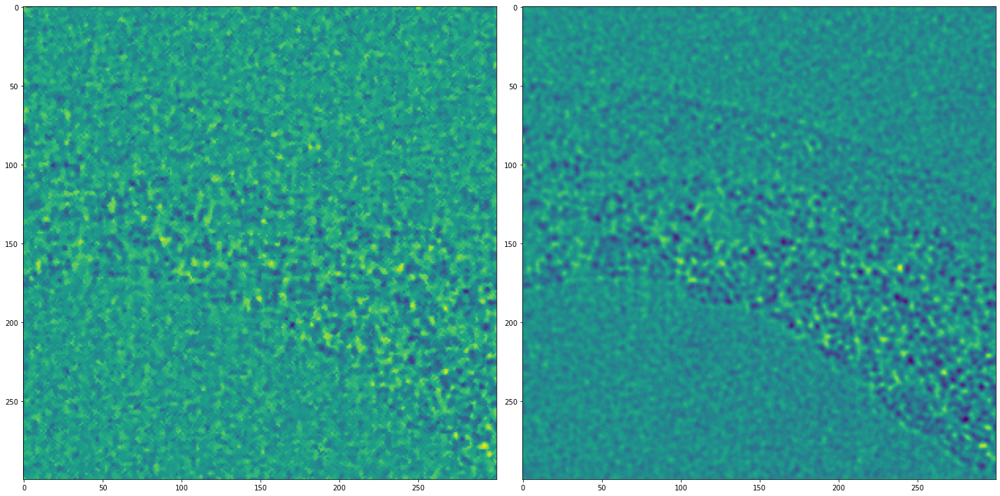

In [142]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
ax1.imshow(rank.median(rescale_intensity(rec_corr_before[0][700:1000, 650:950], out_range=(0, 255)).astype(np.uint8), disk(2)))
ax2.imshow(rec_corr_after[0][700:1000, 650:950])
plt.tight_layout()
plt.show()

(2, 751, 2016)

In [42]:
after2[None, :, 100].shape

(1, 751, 2016)

/tmp/ipykernel_980795/654052965.py:2: UserWarning: Possible precision loss converting image of type float32 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  plt.imshow(rank.entropy(np.clip(after[0], -1, 1), disk(3)))


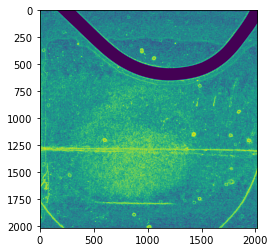

In [19]:
# plt.imshow(rank.entropy(before[0], disk(3)))
plt.imshow(rank.entropy(np.clip(after[0], -1, 1), disk(3)))